In [221]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, \
                                    RandomizedSearchCV
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, \
                            f1_score, plot_confusion_matrix, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.compose import ColumnTransformer
from nltk.tokenize import sent_tokenize, word_tokenize, RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk import FreqDist, pos_tag

import datetime as dt
import time
import requests

from IPython.core.display import display, HTML

from collections import Counter
import string
import emoji
import pickle

# this setting widens how many characters pandas will display in a column:
pd.options.display.max_colwidth = 800


In [67]:
#functions to format all the figures in consistent manner
def format_fig(fig, flag='NotTimeSeries', grid = 'NotFacetGrid'):
    if grid == 'NotFacetGrid':
        fig.suptitle(fig._suptitle.get_text(), fontsize=18, fontweight = 'extra bold', 
                     fontfamily = 'Cambria', color = 'ghostwhite')
        fig.set_facecolor('#00283b')
        axlist = fig.axes
    elif grid == 'FacetGrid':
        fig.fig.suptitle(fig.fig._suptitle.get_text(), fontsize=18, fontweight = 'extra bold', 
                     fontfamily = 'Cambria', color = 'ghostwhite')
        fig.fig.set_facecolor('#00283b')
        axlist = fig.axes.flat
    else:
        pass
    
    
    #loop through all the axes in the figure
    for ax in axlist:
        #ax = ax.get_shared_x_axes().get_siblings(ax)[1] #primary axis location
        ax.grid(False)
        ax.set_facecolor('#00283b')
        ax.tick_params(axis='both', which='both', labelsize=12, labelcolor = 'ghostwhite', color='ghostwhite')
        if flag == 'NotTimeSeries':
            ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000) + 'K'))
        elif flag == 'TimeSeries':
            axPrimary = ax.get_shared_x_axes().get_siblings(ax)[1]
            axPrimary.yaxis.set_major_formatter(FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000) + 'K'))
        elif flag =='NoFormatting':
            pass
        else:
            pass

        ax.xaxis.get_label().set_fontname('Cambria')
        ax.xaxis.get_label().set_fontsize(10)
        ax.xaxis.get_label().set_color('ghostwhite')
        ax.yaxis.get_label().set_fontname('Cambria')
        ax.yaxis.get_label().set_fontsize(10)
        ax.yaxis.get_label().set_color('ghostwhite')

        ax.spines['bottom'].set_color('ghostwhite')
        ax.spines['top'].set_color('ghostwhite') 
        ax.spines['right'].set_color('ghostwhite')
        ax.spines['left'].set_color('ghostwhite')

        ax.set_title(ax.get_title(), fontsize=14, fontweight = 'extra bold', fontfamily = 'Cambria', color = 'ghostwhite')

## **Logistic Regression Classifier** 

### Base Model

In [3]:
df = pd.read_csv('../data/df.csv', index_col=0)
df.reset_index(drop=True, inplace=True)

In [5]:
def word_split(text):
    #print (text)
    # split into words by white space
    words = text.split()
    # remove punctuation from each word
    #table = str.maketrans('', '', '''!"#$%&'()*+,.:;<=>?@[\]^_`{|}~''')
    table = str.maketrans('', '', string.punctuation)

    stripped = [w.lower().translate(table) for w in words]
    return list(filter(None, stripped))  # there were empty strings in the list where the text contained space followed \
                                        # by a period followed by a space '_._'

In [6]:
class LemmaTokenizer:
    def __init__(self):
        self.wnl = WordNetLemmatizer()
    def __call__(self, doc):
        return [self.wnl.lemmatize(t) for t in word_split(doc)]

In [7]:
class PorterStemming:
    def __init__(self):
        self.pst = PorterStemmer()
    def __call__(self, doc):
        return [self.pst.stem(t) for t in word_split(doc)]

In [9]:
# Instantiate PorterStemmer.
p_stemmer = PorterStemmer()

In [11]:
table = str.maketrans('', '', string.punctuation)
p_stemmer_stopwords = [w.lower().translate(table) for w in stopwords.words("english")]
p_stemmer_stopwords = [p_stemmer.stem(i) for i in p_stemmer_stopwords]


In [8]:
en = spacy.load('en_core_web_sm')
sw_spacy = en.Defaults.stop_words

In [9]:
table = str.maketrans('', '', string.punctuation)
p_stemmer_stopwords_spacy = [w.lower().translate(table) for w in sw_spacy]
p_stemmer_stopwords_spacy = [p_stemmer.stem(i) for i in p_stemmer_stopwords_spacy]

In [40]:
#X = df[['title', 'selftext']]
X = df['title'] + ' ' + df['selftext']

y = df['subreddit'].map({'beyondthebump':0, 'BabyBumps':1})

### Tuning Hyperparameters - RandomizedSearch

In [170]:
# Let's set a pipeline up with two stages:
# 1. CountVectorizer (transformer)
# 2. Multinomial Naive Bayes (estimator)

logreg_pipe = Pipeline([
    ('tvec', CountVectorizer(stop_words=p_stemmer_stopwords, tokenizer=PorterStemming()) ),
    ('logreg', LogisticRegressionCV(scoring='accuracy', max_iter=1000,
    Cs = np.logspace(-4,1,10)))])

In [171]:
# Search over the following values of hyperparameters:

logreg_pipe_params = {
    
    'tvec__min_df': [0.02,0.03, 0.05, 0.075, 0.10, 0.15], 
    'tvec__max_df': [0.5,0.6,0.7,0.8],
    'tvec__ngram_range': [(1,2), (1,3)], 
    'logreg__penalty' : ['l2']#,
}

In [173]:
# Instantiate GridSearchCV.

logreg_gs = RandomizedSearchCV(logreg_pipe, # what object are we optimizing?
                               logreg_pipe_params, # what parameters values are we searching?
                               cv = 5, # 5-fold cross-validation.
                              n_iter = 35,
                              verbose=3) 

In [174]:
# Fit GridSearch to training data.
import warnings
#warnings.filterwarnings('always')
warnings.filterwarnings('ignore')
logreg_gs.fit(X_train, y_train)

Fitting 5 folds for each of 35 candidates, totalling 175 fits
[CV 1/5] END logreg__penalty=l2, tvec__max_df=0.8, tvec__min_df=0.075, tvec__ngram_range=(1, 2); total time=  15.0s
[CV 2/5] END logreg__penalty=l2, tvec__max_df=0.8, tvec__min_df=0.075, tvec__ngram_range=(1, 2); total time=  14.4s
[CV 3/5] END logreg__penalty=l2, tvec__max_df=0.8, tvec__min_df=0.075, tvec__ngram_range=(1, 2); total time=  14.9s
[CV 4/5] END logreg__penalty=l2, tvec__max_df=0.8, tvec__min_df=0.075, tvec__ngram_range=(1, 2); total time=  14.4s
[CV 5/5] END logreg__penalty=l2, tvec__max_df=0.8, tvec__min_df=0.075, tvec__ngram_range=(1, 2); total time=  14.3s
[CV 1/5] END logreg__penalty=l2, tvec__max_df=0.8, tvec__min_df=0.075, tvec__ngram_range=(1, 3); total time=  15.0s
[CV 2/5] END logreg__penalty=l2, tvec__max_df=0.8, tvec__min_df=0.075, tvec__ngram_range=(1, 3); total time=  15.4s
[CV 3/5] END logreg__penalty=l2, tvec__max_df=0.8, tvec__min_df=0.075, tvec__ngram_range=(1, 3); total time=  15.3s
[CV 4/5] E

[CV 2/5] END logreg__penalty=l2, tvec__max_df=0.5, tvec__min_df=0.075, tvec__ngram_range=(1, 2); total time=  17.9s
[CV 3/5] END logreg__penalty=l2, tvec__max_df=0.5, tvec__min_df=0.075, tvec__ngram_range=(1, 2); total time=  16.2s
[CV 4/5] END logreg__penalty=l2, tvec__max_df=0.5, tvec__min_df=0.075, tvec__ngram_range=(1, 2); total time=  15.5s
[CV 5/5] END logreg__penalty=l2, tvec__max_df=0.5, tvec__min_df=0.075, tvec__ngram_range=(1, 2); total time=  15.5s
[CV 1/5] END logreg__penalty=l2, tvec__max_df=0.6, tvec__min_df=0.03, tvec__ngram_range=(1, 3); total time=  16.7s
[CV 2/5] END logreg__penalty=l2, tvec__max_df=0.6, tvec__min_df=0.03, tvec__ngram_range=(1, 3); total time=  17.6s
[CV 3/5] END logreg__penalty=l2, tvec__max_df=0.6, tvec__min_df=0.03, tvec__ngram_range=(1, 3); total time=  16.3s
[CV 4/5] END logreg__penalty=l2, tvec__max_df=0.6, tvec__min_df=0.03, tvec__ngram_range=(1, 3); total time=  16.9s
[CV 5/5] END logreg__penalty=l2, tvec__max_df=0.6, tvec__min_df=0.03, tvec__

[CV 4/5] END logreg__penalty=l2, tvec__max_df=0.6, tvec__min_df=0.03, tvec__ngram_range=(1, 2); total time=  17.5s
[CV 5/5] END logreg__penalty=l2, tvec__max_df=0.6, tvec__min_df=0.03, tvec__ngram_range=(1, 2); total time=  17.4s
[CV 1/5] END logreg__penalty=l2, tvec__max_df=0.5, tvec__min_df=0.02, tvec__ngram_range=(1, 3); total time=  19.6s
[CV 2/5] END logreg__penalty=l2, tvec__max_df=0.5, tvec__min_df=0.02, tvec__ngram_range=(1, 3); total time=  17.5s
[CV 3/5] END logreg__penalty=l2, tvec__max_df=0.5, tvec__min_df=0.02, tvec__ngram_range=(1, 3); total time=  17.9s
[CV 4/5] END logreg__penalty=l2, tvec__max_df=0.5, tvec__min_df=0.02, tvec__ngram_range=(1, 3); total time=  18.0s
[CV 5/5] END logreg__penalty=l2, tvec__max_df=0.5, tvec__min_df=0.02, tvec__ngram_range=(1, 3); total time=  16.8s
[CV 1/5] END logreg__penalty=l2, tvec__max_df=0.7, tvec__min_df=0.03, tvec__ngram_range=(1, 3); total time=  16.5s
[CV 2/5] END logreg__penalty=l2, tvec__max_df=0.7, tvec__min_df=0.03, tvec__ngra

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('tvec',
                                              CountVectorizer(stop_words=['i',
                                                                          'me',
                                                                          'my',
                                                                          'myself',
                                                                          'we',
                                                                          'our',
                                                                          'our',
                                                                          'ourselv',
                                                                          'you',
                                                                          'your',
                                                                          'youv',
                          

In [175]:
logreg_gs.best_params_

{'tvec__ngram_range': (1, 2),
 'tvec__min_df': 0.02,
 'tvec__max_df': 0.6,
 'logreg__penalty': 'l2'}

In [176]:
logreg_gs.score(X_train, y_train), logreg_gs.score(X_test, y_test)

(0.8440315315315315, 0.8242354958559589)

In [177]:
logreg_gs.best_estimator_[1].C_

array([0.01668101])

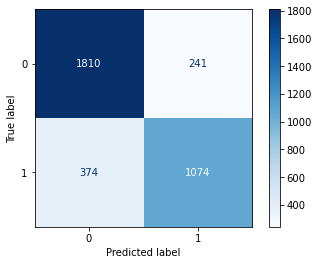

In [178]:
# View confusion matrix
plot_confusion_matrix(logreg_gs, X_test, y_test, cmap='Blues');

In [179]:
len(logreg_gs.best_estimator_[0].get_feature_names())

644

## **Feature Engineering - Document Lengths and Sentiment Analysis Scores**
### Logistic Regression

In [203]:
#X = df[['title', 'selftext']]
X = df['title'] + ' ' + df['selftext']

y = df['subreddit'].map({'beyondthebump':0, 'BabyBumps':1})

In [204]:
type(X)

pandas.core.series.Series

In [205]:
X.name = 'title_selftext'

In [206]:
X = X.to_frame()

In [207]:
X['doc_len'] = X['title_selftext'].apply(lambda x: sum(map(len, x.split())))

In [208]:
X['doc_len']

0        611
1        934
2        318
3        893
4        757
        ... 
10598    410
10599    536
10600    656
10601    362
10602    453
Name: doc_len, Length: 10603, dtype: int64

In [209]:
X['subreddit'] = y

In [210]:
X['doc_id']=X.index

In [214]:
doc_len =  X.groupby(['subreddit', 'doc_id']).mean()['doc_len']

In [215]:
doc_len.name = 'count'

In [216]:
doc_len = doc_len.reset_index().sort_values(by='subreddit', ascending=False)

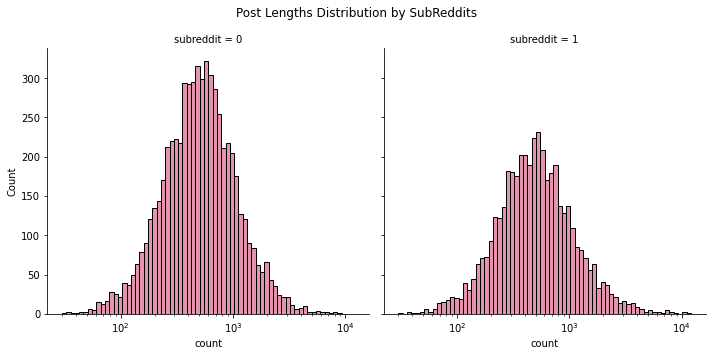

In [217]:
g = sns.displot(data=doc_len, x ='count', col='subreddit', log_scale = True, 
                color='palevioletred', height = 5)
g.fig.suptitle('Post Lengths Distribution by SubReddits')
format_fig(fig = g, flag = 'NoFormatting', grid = 'FacetGrid')

plt.tight_layout()

In [218]:
X.drop(columns=['subreddit', 'doc_id'],inplace=True)

In [271]:
#instantiate SIA

sia = SentimentIntensityAnalyzer()

In [272]:
corpus = list(df['title'] + ' ' + df['selftext'])

In [274]:
#create dataframe that contains text and the polarity scores for each tweet

sentiment = []    

for title_selftext in corpus:
    scores = sia.polarity_scores(title_selftext)
    sentiment.append(scores)

sent_df = pd.DataFrame(sentiment)
sent_df

,neg,neu,pos,compound
0,0.156,0.708,0.135,-0.6018
1,0.018,0.720,0.263,0.9966
2,0.058,0.895,0.047,-0.2240
3,0.028,0.885,0.087,0.9243
4,0.043,0.835,0.122,0.9053
...,...,...,...,...
10598,0.126,0.771,0.103,-0.5621
10599,0.025,0.878,0.097,0.8549
10600,0.012,0.858,0.130,0.9559
10601,0.062,0.727,0.211,0.9274


In [297]:
X = pd.concat([X,sent_df], axis=1)

In [298]:
sentiments_drop = ['neu', 'pos', 'compound']

In [299]:
X.drop(columns=sentiments_drop, inplace=True)

In [300]:
# Split the data into the training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.33,
                                                    stratify=y,
                                                    random_state=42)

In [301]:
cols_trans = ColumnTransformer([('tvec', CountVectorizer(stop_words=p_stemmer_stopwords, tokenizer=PorterStemming()), 'title_selftext')]
                               ,remainder='passthrough')

In [302]:

logreg_pipe = Pipeline([
    ('coltran', cols_trans),
    ('logreg', LogisticRegressionCV(scoring='accuracy', max_iter=1000 , Cs = np.logspace(-3,1,10)
    ))])

In [304]:

logreg_pipe_params = {
    'coltran__tvec__min_df': [0.02], 
    'coltran__tvec__max_df': [0.9], 
    'coltran__tvec__ngram_range': [(1,2), (1,3)], 
    'logreg__penalty' : ['l2']
    
}

In [305]:
# Instantiate GridSearchCV.

logreg_gs = RandomizedSearchCV(logreg_pipe, # what object are we optimizing?
                               logreg_pipe_params, # what parameters values are we searching?
                               cv = 5, # 5-fold cross-validation.
                              n_iter = 35,
                              verbose=3) 

In [306]:
# Fit GridSearch to training data.
import warnings
#warnings.filterwarnings('always')
warnings.filterwarnings('ignore')
logreg_gs.fit(X_train, y_train)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV 1/5] END coltran__tvec__max_df=0.9, coltran__tvec__min_df=0.02, coltran__tvec__ngram_range=(1, 2), logreg__penalty=l2; total time=  18.8s
[CV 2/5] END coltran__tvec__max_df=0.9, coltran__tvec__min_df=0.02, coltran__tvec__ngram_range=(1, 2), logreg__penalty=l2; total time=  20.2s
[CV 3/5] END coltran__tvec__max_df=0.9, coltran__tvec__min_df=0.02, coltran__tvec__ngram_range=(1, 2), logreg__penalty=l2; total time=  20.8s
[CV 4/5] END coltran__tvec__max_df=0.9, coltran__tvec__min_df=0.02, coltran__tvec__ngram_range=(1, 2), logreg__penalty=l2; total time=  19.8s
[CV 5/5] END coltran__tvec__max_df=0.9, coltran__tvec__min_df=0.02, coltran__tvec__ngram_range=(1, 2), logreg__penalty=l2; total time=  19.7s
[CV 1/5] END coltran__tvec__max_df=0.9, coltran__tvec__min_df=0.02, coltran__tvec__ngram_range=(1, 3), logreg__penalty=l2; total time=  19.3s
[CV 2/5] END coltran__tvec__max_df=0.9, coltran__tvec__min_df=0.02, coltran__tvec__ngram

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('coltran',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('tvec',
                                                                               CountVectorizer(stop_words=['i',
                                                                                                           'me',
                                                                                                           'my',
                                                                                                           'myself',
                                                                                                           'we',
                                                                                                           'our',
                                                            

In [307]:
logreg_gs.score(X_train, y_train), logreg_gs.score(X_test, y_test)

(0.8381193693693694, 0.8239496999142613)

## **MultinomialNB**

### Tuning Hyperparameters - GridSearch

In [184]:
X = df['title'] + df['selftext']
y = df['subreddit'].map({'beyondthebump':0, 'BabyBumps':1})

In [185]:
(X.shape)

(10603,)

In [186]:
# Define training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.33,
                                                    stratify=y,
                                                    random_state=42)

In [187]:
X_train.shape, X_test.shape

((7104,), (3499,))

In [188]:
# Baseline Accuracy
y_train.value_counts()

0    4164
1    2940
Name: subreddit, dtype: int64

In [224]:
mnb_pipe = Pipeline([
    ('cvec', TfidfVectorizer() ),
    ('mnb', MultinomialNB())
])

In [226]:
mnb_pipe_params = {
    'cvec__stop_words' : [p_stemmer_stopwords, None],
    'cvec__tokenizer' : [PorterStemming(), LemmaTokenizer()],
    'cvec__max_features': [3000, 4000, 5000, 6000],
    'cvec__min_df': [0, 1, 2],
    'cvec__max_df': [0.55, 0.6, 0.65],
    'cvec__ngram_range': [(1,2), (1,3)],
    'mnb__alpha' : [0.4, 0.5, 0.7, 1]
}

In [227]:
# Instantiate GridSearchCV.

mnb_gs = GridSearchCV(mnb_pipe, # what object are we optimizing?
                  mnb_pipe_params, # what parameters values are we searching?
                 cv = 5,
                        verbose=10) # 5-fold cross-validation.

In [228]:
# Fit GridSearch to training data.
mnb_gs.fit(X_train, y_train)

Fitting 5 folds for each of 1152 candidates, totalling 5760 fits
[CV 1/5; 1/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 2/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 2/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 2/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 2/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 2/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 3/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 3/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 3/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 3/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 3/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 4/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 4/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 4/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 4/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 4/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

[CV 3/5; 5/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

[CV 1/5; 6/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

[CV 4/5; 6/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

[CV 2/5; 7/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

[CV 5/5; 7/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

[CV 3/5; 8/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most', 

[CV 1/5; 9/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.3s
[CV 2/5; 9/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 9/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.2s
[CV 3/5; 9/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 9/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__n

[CV 4/5; 12/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  28.3s
[CV 5/5; 12/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 12/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  28.2s
[CV 1/5; 13/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 13/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ng

[CV 2/5; 16/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 3/5; 16/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 16/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   8.9s
[CV 4/5; 16/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 16/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 17/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 17/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 17/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 17/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 17/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 18/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 18/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 18/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 18/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 18/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 19/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 19/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 19/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 19/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 19/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 20/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 20/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 20/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 20/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 20/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 21/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 22/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 22/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 23/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 23/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 24/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 25/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.8s
[CV 2/5; 25/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 25/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.1s
[CV 3/5; 25/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 25/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cv

[CV 4/5; 28/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.2s
[CV 5/5; 28/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 28/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.9s
[CV 1/5; 29/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 29/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ng

[CV 2/5; 32/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.8s
[CV 3/5; 32/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 32/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.7s
[CV 4/5; 32/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 32/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=0, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 33/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 33/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 33/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 33/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 33/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 34/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 34/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 34/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 34/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 34/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 35/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 35/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 35/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 35/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 35/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 36/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 36/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 36/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 36/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 36/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 37/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 38/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 38/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 39/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 39/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 40/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 41/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.5s
[CV 2/5; 41/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 41/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.9s
[CV 3/5; 41/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 41/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cv

[CV 4/5; 44/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.6s
[CV 5/5; 44/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 44/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.3s
[CV 1/5; 45/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 45/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ng

[CV 2/5; 48/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 3/5; 48/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 48/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.2s
[CV 4/5; 48/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 48/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 49/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 49/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 49/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 49/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 49/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 50/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 50/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 50/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 50/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 50/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 51/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 51/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 51/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 51/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 51/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 52/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 52/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 52/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 52/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 52/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 53/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 54/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 54/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 55/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 55/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 56/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 57/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.3s
[CV 2/5; 57/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 57/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.7s
[CV 3/5; 57/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 57/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cv

[CV 4/5; 60/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  33.9s
[CV 5/5; 60/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 60/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.2s
[CV 1/5; 61/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 61/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ng

[CV 2/5; 64/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.5s
[CV 3/5; 64/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 64/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.2s
[CV 4/5; 64/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 64/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=1, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 65/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 65/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 65/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 65/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 65/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 66/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 66/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 66/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 66/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 66/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 67/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 67/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 67/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 67/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 67/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 68/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 68/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 68/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 68/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 68/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 69/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 70/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 70/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 71/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 71/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 72/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 73/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.5s
[CV 2/5; 73/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 73/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.9s
[CV 3/5; 73/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 73/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cv

[CV 4/5; 76/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.8s
[CV 5/5; 76/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 76/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.9s
[CV 1/5; 77/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 77/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ng

[CV 2/5; 80/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.4s
[CV 3/5; 80/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 80/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   8.9s
[CV 4/5; 80/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 80/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 81/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 81/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 81/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 81/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 81/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 82/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 82/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 82/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 82/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 82/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 83/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 83/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 83/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 83/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 83/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 84/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 84/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 84/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 84/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 84/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 85/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 86/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 86/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 87/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 87/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 88/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 89/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.5s
[CV 2/5; 89/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 89/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.3s
[CV 3/5; 89/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 89/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cv

[CV 4/5; 92/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.5s
[CV 5/5; 92/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 92/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.3s
[CV 1/5; 93/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 93/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ng

[CV 2/5; 96/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.7s
[CV 3/5; 96/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 96/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.8s
[CV 4/5; 96/1152] START cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 96/1152] END cvec__max_df=0.55, cvec__max_features=3000, cvec__min_df=2, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 97/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 97/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 97/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 97/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 97/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 98/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 98/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 98/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 98/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 98/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 99/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 99/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 99/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 99/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 99/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 100/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 100/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 100/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 100/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 100/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 101/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 102/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 102/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 103/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 103/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 104/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 105/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.6s
[CV 2/5; 105/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 105/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.9s
[CV 3/5; 105/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 105/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 108/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.5s
[CV 5/5; 108/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 108/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.1s
[CV 1/5; 109/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 109/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cve

[CV 2/5; 112/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 3/5; 112/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 112/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 4/5; 112/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 112/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 113/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 113/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 113/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 113/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 113/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 114/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 114/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 114/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 114/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 114/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 115/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 115/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 115/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 115/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 115/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 116/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 116/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 116/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 116/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 116/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 117/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 118/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 118/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 119/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 119/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 120/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 121/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.2s
[CV 2/5; 121/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 121/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.7s
[CV 3/5; 121/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 121/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 124/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.6s
[CV 5/5; 124/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 124/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.7s
[CV 1/5; 125/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 125/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cve

[CV 2/5; 128/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.7s
[CV 3/5; 128/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 128/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.7s
[CV 4/5; 128/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 128/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 129/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 129/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 129/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 129/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 129/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 130/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 130/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 130/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 130/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 130/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 131/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 131/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 131/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 131/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 131/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 132/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 132/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 132/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 132/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 132/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 133/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 134/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 134/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 135/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 135/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 136/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 137/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.6s
[CV 2/5; 137/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 137/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.6s
[CV 3/5; 137/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 137/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 140/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.6s
[CV 5/5; 140/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 140/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.2s
[CV 1/5; 141/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 141/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cve

[CV 2/5; 144/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.4s
[CV 3/5; 144/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 144/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.6s
[CV 4/5; 144/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 144/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 145/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 145/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 145/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 145/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 145/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 146/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 146/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 146/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 146/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 146/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 147/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 147/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 147/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 147/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 147/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 148/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 148/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 148/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 148/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 148/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 149/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 150/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 150/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 151/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 151/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 152/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 153/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.8s
[CV 2/5; 153/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 153/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.0s
[CV 3/5; 153/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 153/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 156/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.7s
[CV 5/5; 156/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 156/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.0s
[CV 1/5; 157/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 157/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cve

[CV 2/5; 160/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.0s
[CV 3/5; 160/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 160/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.9s
[CV 4/5; 160/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 160/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=1, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 161/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 161/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 161/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 161/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 161/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 162/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 162/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 162/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 162/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 162/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 163/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 163/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 163/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 163/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 163/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 164/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 164/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 164/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 164/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 164/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 165/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 166/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 166/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 167/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 167/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 168/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 169/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.8s
[CV 2/5; 169/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 169/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.0s
[CV 3/5; 169/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 169/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 172/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.9s
[CV 5/5; 172/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 172/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.7s
[CV 1/5; 173/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 173/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cve

[CV 2/5; 176/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.5s
[CV 3/5; 176/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 176/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.2s
[CV 4/5; 176/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 176/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 177/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 177/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 177/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 177/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 177/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 178/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 178/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 178/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 178/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 178/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 179/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 179/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 179/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 179/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 179/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 180/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 180/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 180/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 180/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 180/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 181/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 182/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 182/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 183/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 183/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 184/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 185/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.5s
[CV 2/5; 185/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 185/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.7s
[CV 3/5; 185/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 185/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 188/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  32.8s
[CV 5/5; 188/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 188/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  34.3s
[CV 1/5; 189/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 189/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cve

[CV 2/5; 192/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  19.9s
[CV 3/5; 192/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 192/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  21.1s
[CV 4/5; 192/1152] START cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 192/1152] END cvec__max_df=0.55, cvec__max_features=4000, cvec__min_df=2, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 193/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 193/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 193/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 193/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 193/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 194/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 194/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 194/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 194/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 194/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 195/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 195/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 195/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 195/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 195/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 196/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 196/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 196/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 196/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 196/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 197/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 198/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 198/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 199/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 199/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 200/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 201/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.1min
[CV 2/5; 201/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 201/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  38.4s
[CV 3/5; 201/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 201/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=

[CV 4/5; 204/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time= 1.3min
[CV 5/5; 204/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 204/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  53.4s
[CV 1/5; 205/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 205/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cve

[CV 2/5; 208/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  23.5s
[CV 3/5; 208/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 208/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  27.8s
[CV 4/5; 208/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 208/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 209/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 209/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 209/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 209/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 209/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 210/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 210/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 210/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 210/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 210/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 211/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 211/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 211/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 211/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 211/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 212/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 212/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 212/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 212/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 212/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 213/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 214/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 214/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 215/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 215/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 216/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 217/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  44.9s
[CV 2/5; 217/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 217/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  44.0s
[CV 3/5; 217/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 217/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=

[CV 4/5; 220/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time= 1.0min
[CV 5/5; 220/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 220/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  59.5s
[CV 1/5; 221/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 221/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cve

[CV 2/5; 224/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  21.4s
[CV 3/5; 224/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 224/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  23.8s
[CV 4/5; 224/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 224/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 225/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 225/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 225/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 225/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 225/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 226/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 226/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 226/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 226/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 226/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 227/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 227/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 227/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 227/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 227/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 228/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 228/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 228/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 228/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 228/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 229/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 230/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 230/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 231/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 231/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 232/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 233/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  53.1s
[CV 2/5; 233/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 233/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  50.9s
[CV 3/5; 233/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 233/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=

[CV 4/5; 236/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  46.5s
[CV 5/5; 236/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 236/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.3s
[CV 1/5; 237/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 237/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cve

[CV 2/5; 240/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 3/5; 240/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 240/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 4/5; 240/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 240/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 241/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 241/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 241/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 241/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 241/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 242/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 242/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 242/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 242/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 242/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 243/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 243/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 243/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 243/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 243/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 244/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 244/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 244/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 244/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 244/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 245/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 246/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 246/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 247/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 247/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 248/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 249/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  32.2s
[CV 2/5; 249/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 249/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.7s
[CV 3/5; 249/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 249/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=

[CV 4/5; 252/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.4s
[CV 5/5; 252/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 252/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.7s
[CV 1/5; 253/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 253/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cve

[CV 2/5; 256/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.6s
[CV 3/5; 256/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 256/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.7s
[CV 4/5; 256/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 256/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=1, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 257/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 257/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 257/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 257/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 257/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 258/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 258/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 258/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 258/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 258/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 259/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 259/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 259/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 259/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 259/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 260/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 260/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 260/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 260/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 260/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 261/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 262/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 262/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 263/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 263/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 264/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 265/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.7s
[CV 2/5; 265/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 265/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.7s
[CV 3/5; 265/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 265/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=

[CV 4/5; 268/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.8s
[CV 5/5; 268/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 268/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.5s
[CV 1/5; 269/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 269/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cve

[CV 2/5; 272/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   8.9s
[CV 3/5; 272/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 272/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   8.9s
[CV 4/5; 272/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 272/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 273/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 273/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 273/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 273/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 273/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 274/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 274/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 274/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 274/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 274/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 275/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 275/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 275/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 275/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 275/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 276/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 276/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 276/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 276/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 276/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 277/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 278/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 278/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 279/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 279/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 280/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 281/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.4s
[CV 2/5; 281/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 281/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.3s
[CV 3/5; 281/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 281/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=

[CV 4/5; 284/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.8s
[CV 5/5; 284/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 284/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.0s
[CV 1/5; 285/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 285/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cve

[CV 2/5; 288/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.7s
[CV 3/5; 288/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 288/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.7s
[CV 4/5; 288/1152] START cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 288/1152] END cvec__max_df=0.55, cvec__max_features=5000, cvec__min_df=2, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 289/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 289/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 289/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 289/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 289/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 290/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 290/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 290/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 290/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 290/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 291/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 291/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 291/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 291/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 291/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 292/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 292/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 292/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 292/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 292/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 293/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 294/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 294/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 295/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 295/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 296/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 297/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.3s
[CV 2/5; 297/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 297/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  29.1s
[CV 3/5; 297/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 297/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=

[CV 4/5; 300/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.7s
[CV 5/5; 300/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 300/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.7s
[CV 1/5; 301/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 301/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cve

[CV 2/5; 304/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.3s
[CV 3/5; 304/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 304/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 4/5; 304/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 304/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 305/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 305/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 305/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 305/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 305/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 306/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 306/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 306/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 306/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 306/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 307/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 307/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 307/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 307/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 307/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 308/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 308/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 308/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 308/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 308/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 309/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 310/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 310/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 311/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 311/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 312/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 313/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.1s
[CV 2/5; 313/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 313/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.3s
[CV 3/5; 313/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 313/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=

[CV 4/5; 316/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.3s
[CV 5/5; 316/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 316/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.9s
[CV 1/5; 317/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 317/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cve

[CV 2/5; 320/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.8s
[CV 3/5; 320/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 320/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.6s
[CV 4/5; 320/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 320/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 321/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 321/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 321/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 321/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 321/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 322/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 322/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 322/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 322/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 322/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 323/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 323/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 323/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 323/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 323/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 324/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 324/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 324/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 324/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 324/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 325/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 326/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 326/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 327/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 327/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 328/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 329/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.0s
[CV 2/5; 329/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 329/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.5s
[CV 3/5; 329/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 329/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=

[CV 4/5; 332/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.8s
[CV 5/5; 332/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 332/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.6s
[CV 1/5; 333/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 333/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cve

[CV 2/5; 336/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   8.9s
[CV 3/5; 336/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 336/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.2s
[CV 4/5; 336/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 336/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 337/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 337/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 337/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 337/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 337/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 338/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 338/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 338/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 338/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 338/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 339/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 339/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 339/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 339/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 339/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 340/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 340/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 340/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 340/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 340/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 341/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 342/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 342/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 343/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 343/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 344/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 345/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.5s
[CV 2/5; 345/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 345/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.0s
[CV 3/5; 345/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 345/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=

[CV 4/5; 348/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.8s
[CV 5/5; 348/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 348/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.4s
[CV 1/5; 349/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 349/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cve

[CV 2/5; 352/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.5s
[CV 3/5; 352/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 352/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  14.1s
[CV 4/5; 352/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 352/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=1, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 353/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 353/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 353/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 353/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 353/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 354/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 354/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 354/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 354/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 354/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 355/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 355/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 355/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 355/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 355/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 356/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 356/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 356/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 356/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 356/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 357/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 358/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 358/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 359/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 359/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 360/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 361/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.8s
[CV 2/5; 361/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 361/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.0s
[CV 3/5; 361/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 361/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=

[CV 4/5; 364/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  54.1s
[CV 5/5; 364/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 364/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  53.8s
[CV 1/5; 365/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 365/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cve

[CV 2/5; 368/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  17.3s
[CV 3/5; 368/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 368/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  17.3s
[CV 4/5; 368/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 368/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 369/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 369/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 369/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 369/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 369/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 370/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 370/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 370/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 370/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 370/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 371/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 371/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 371/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 371/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 371/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 372/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 372/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 372/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 372/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 372/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 373/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 374/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 374/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 375/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 375/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 376/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 377/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.0min
[CV 2/5; 377/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 377/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.0min
[CV 3/5; 377/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 377/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=

[CV 4/5; 380/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  59.9s
[CV 5/5; 380/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 380/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time= 1.0min
[CV 1/5; 381/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 381/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cve

[CV 2/5; 384/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  23.7s
[CV 3/5; 384/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 384/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  24.1s
[CV 4/5; 384/1152] START cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 384/1152] END cvec__max_df=0.55, cvec__max_features=6000, cvec__min_df=2, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 385/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 385/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 385/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 385/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 385/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 386/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 386/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 386/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 386/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 386/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 387/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 387/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 387/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 387/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 387/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 388/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 388/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 388/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 388/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 388/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 389/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 390/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 390/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 391/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 391/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 392/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 393/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  54.6s
[CV 2/5; 393/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 393/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  54.2s
[CV 3/5; 393/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 393/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cv

[CV 4/5; 396/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  53.4s
[CV 5/5; 396/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 396/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  53.9s
[CV 1/5; 397/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 397/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ng

[CV 2/5; 400/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  17.3s
[CV 3/5; 400/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 400/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  17.4s
[CV 4/5; 400/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 400/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 401/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 401/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 401/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 401/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 401/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 402/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 402/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 402/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 402/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 402/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 403/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 403/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 403/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 403/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 403/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 404/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 404/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 404/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 404/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 404/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 405/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 406/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 406/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 407/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 407/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 408/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 409/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.0min
[CV 2/5; 409/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 409/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  60.0s
[CV 3/5; 409/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 409/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cv

[CV 4/5; 412/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time= 1.0min
[CV 5/5; 412/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 412/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  59.9s
[CV 1/5; 413/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 413/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ng

[CV 2/5; 416/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  23.5s
[CV 3/5; 416/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 416/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  24.3s
[CV 4/5; 416/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 416/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=0, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 417/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 417/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 417/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 417/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 417/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 418/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 418/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 418/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 418/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 418/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 419/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 419/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 419/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 419/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 419/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 420/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 420/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 420/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 420/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 420/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 421/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 422/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 422/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 423/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 423/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 424/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 425/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  54.7s
[CV 2/5; 425/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 425/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  53.6s
[CV 3/5; 425/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 425/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cv

[CV 4/5; 428/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  54.5s
[CV 5/5; 428/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 428/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  53.9s
[CV 1/5; 429/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 429/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ng

[CV 2/5; 432/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  17.3s
[CV 3/5; 432/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 432/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  17.2s
[CV 4/5; 432/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 432/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 433/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 433/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 433/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 433/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 433/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 434/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 434/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 434/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 434/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 434/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 435/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 435/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 435/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 435/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 435/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 436/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 436/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 436/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 436/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 436/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 437/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 438/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 438/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 439/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 439/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 440/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 441/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  59.6s
[CV 2/5; 441/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 441/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.0min
[CV 3/5; 441/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 441/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cv

[CV 4/5; 444/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  59.9s
[CV 5/5; 444/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 444/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  59.9s
[CV 1/5; 445/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 445/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ng

[CV 2/5; 448/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  23.9s
[CV 3/5; 448/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 448/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  23.4s
[CV 4/5; 448/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 448/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=1, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 449/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 449/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 449/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 449/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 449/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 450/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 450/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 450/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 450/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 450/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 451/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 451/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 451/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 451/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 451/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 452/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 452/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 452/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 452/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 452/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 453/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 454/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 454/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 455/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 455/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 456/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 457/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  54.9s
[CV 2/5; 457/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 457/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  54.1s
[CV 3/5; 457/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 457/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cv

[CV 4/5; 460/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  54.0s
[CV 5/5; 460/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 460/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  54.1s
[CV 1/5; 461/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 461/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ng

[CV 2/5; 464/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  16.2s
[CV 3/5; 464/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 464/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  18.8s
[CV 4/5; 464/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 464/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 465/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 465/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 465/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 465/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 465/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 466/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 466/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 466/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 466/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 466/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 467/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 467/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 467/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 467/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 467/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 468/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 468/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 468/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 468/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 468/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 469/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 470/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 470/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 471/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 471/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 472/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 473/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.0min
[CV 2/5; 473/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 473/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.0min
[CV 3/5; 473/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 473/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cv

[CV 4/5; 476/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  59.6s
[CV 5/5; 476/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 476/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  58.7s
[CV 1/5; 477/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 477/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ng

[CV 2/5; 480/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  24.0s
[CV 3/5; 480/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 480/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  24.5s
[CV 4/5; 480/1152] START cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 480/1152] END cvec__max_df=0.6, cvec__max_features=3000, cvec__min_df=2, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 481/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 481/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 481/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 481/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 481/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 482/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 482/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 482/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 482/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 482/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 483/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 483/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 483/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 483/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 483/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 484/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 484/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 484/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 484/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 484/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 485/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 486/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 486/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 487/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 487/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 488/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 489/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  55.5s
[CV 2/5; 489/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 489/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  55.5s
[CV 3/5; 489/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 489/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cv

[CV 4/5; 492/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  54.6s
[CV 5/5; 492/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 492/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  54.9s
[CV 1/5; 493/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 493/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ng

[CV 2/5; 496/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  17.6s
[CV 3/5; 496/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 496/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  17.9s
[CV 4/5; 496/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 496/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 497/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 497/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 497/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 497/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 497/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 498/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 498/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 498/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 498/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 498/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 499/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 499/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 499/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 499/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 499/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 500/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 500/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 500/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 500/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 500/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 501/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 502/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 502/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 503/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 503/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 504/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 505/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.0min
[CV 2/5; 505/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 505/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.1min
[CV 3/5; 505/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 505/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cv

[CV 4/5; 508/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time= 1.1min
[CV 5/5; 508/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 508/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time= 1.0min
[CV 1/5; 509/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 509/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ng

[CV 2/5; 512/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  24.5s
[CV 3/5; 512/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 512/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  24.6s
[CV 4/5; 512/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 512/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=0, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 513/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 513/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 513/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 513/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 513/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 514/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 514/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 514/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 514/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 514/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 515/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 515/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 515/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 515/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 515/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 516/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 516/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 516/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 516/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 516/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 517/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 518/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 518/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 519/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 519/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 520/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 521/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.2s
[CV 2/5; 521/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 521/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.5s
[CV 3/5; 521/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 521/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cv

[CV 4/5; 524/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.9s
[CV 5/5; 524/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 524/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.0s
[CV 1/5; 525/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 525/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ng

[CV 2/5; 528/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.2s
[CV 3/5; 528/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 528/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.3s
[CV 4/5; 528/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 528/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 529/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 529/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 529/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 529/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 529/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 530/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 530/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 530/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 530/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 530/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 531/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 531/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 531/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 531/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 531/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 532/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 532/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 532/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 532/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 532/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 533/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 534/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 534/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 535/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 535/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 536/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 537/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  34.4s
[CV 2/5; 537/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 537/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  32.2s
[CV 3/5; 537/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 537/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cv

[CV 4/5; 540/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  38.6s
[CV 5/5; 540/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 540/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  34.6s
[CV 1/5; 541/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 541/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ng

[CV 2/5; 544/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.9s
[CV 3/5; 544/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 544/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.0s
[CV 4/5; 544/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 544/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=1, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 545/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 545/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 545/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 545/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 545/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 546/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 546/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 546/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 546/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 546/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 547/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 547/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 547/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 547/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 547/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 548/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 548/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 548/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 548/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 548/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 549/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 550/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 550/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 551/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 551/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 552/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 553/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.9s
[CV 2/5; 553/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 553/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.5s
[CV 3/5; 553/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 553/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cv

[CV 4/5; 556/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.0s
[CV 5/5; 556/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 556/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.1s
[CV 1/5; 557/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 557/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ng

[CV 2/5; 560/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  10.0s
[CV 3/5; 560/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 560/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.3s
[CV 4/5; 560/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 560/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 561/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 561/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 561/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 561/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 561/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 562/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 562/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 562/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 562/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 562/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 563/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 563/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 563/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 563/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 563/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 564/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 564/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 564/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 564/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 564/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 565/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 566/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 566/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 567/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 567/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 568/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 569/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.3s
[CV 2/5; 569/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 569/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.6s
[CV 3/5; 569/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 569/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cv

[CV 4/5; 572/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.8s
[CV 5/5; 572/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 572/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.8s
[CV 1/5; 573/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 573/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ng

[CV 2/5; 576/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.0s
[CV 3/5; 576/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 576/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.7s
[CV 4/5; 576/1152] START cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 576/1152] END cvec__max_df=0.6, cvec__max_features=4000, cvec__min_df=2, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 577/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 577/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 577/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 577/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 577/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 578/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 578/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 578/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 578/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 578/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 579/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 579/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 579/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 579/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 579/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 580/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 580/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 580/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 580/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 580/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 581/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 582/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 582/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 583/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 583/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 584/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 585/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.8s
[CV 2/5; 585/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 585/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.8s
[CV 3/5; 585/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 585/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cv

[CV 4/5; 588/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.6s
[CV 5/5; 588/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 588/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.2s
[CV 1/5; 589/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 589/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ng

[CV 2/5; 592/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 3/5; 592/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 592/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 4/5; 592/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 592/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 593/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 593/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 593/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 593/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 593/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 594/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 594/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 594/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 594/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 594/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 595/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 595/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 595/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 595/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 595/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 596/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 596/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 596/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 596/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 596/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 597/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 598/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 598/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 599/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 599/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 600/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 601/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.3s
[CV 2/5; 601/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 601/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.4s
[CV 3/5; 601/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 601/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cv

[CV 4/5; 604/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  32.9s
[CV 5/5; 604/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 604/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.5s
[CV 1/5; 605/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 605/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ng

[CV 2/5; 608/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.0s
[CV 3/5; 608/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 608/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.7s
[CV 4/5; 608/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 608/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=0, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 609/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 609/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 609/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 609/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 609/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 610/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 610/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 610/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 610/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 610/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 611/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 611/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 611/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 611/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 611/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 612/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 612/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 612/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 612/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 612/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 613/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 614/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 614/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 615/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 615/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 616/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 617/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.4s
[CV 2/5; 617/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 617/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  28.0s
[CV 3/5; 617/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 617/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cv

[CV 4/5; 620/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.3s
[CV 5/5; 620/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 620/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.0s
[CV 1/5; 621/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 621/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ng

[CV 2/5; 624/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 3/5; 624/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 624/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 4/5; 624/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 624/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 625/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 625/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 625/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 625/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 625/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 626/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 626/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 626/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 626/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 626/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 627/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 627/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 627/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 627/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 627/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 628/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 628/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 628/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 628/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 628/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 629/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 630/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 630/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 631/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 631/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 632/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 633/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.9s
[CV 2/5; 633/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 633/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  32.2s
[CV 3/5; 633/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 633/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cv

[CV 4/5; 636/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.9s
[CV 5/5; 636/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 636/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.9s
[CV 1/5; 637/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 637/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ng

[CV 2/5; 640/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.9s
[CV 3/5; 640/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 640/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.0s
[CV 4/5; 640/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 640/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=1, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 641/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 641/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 641/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 641/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 641/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 642/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 642/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 642/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 642/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 642/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 643/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 643/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 643/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 643/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 643/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 644/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 644/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 644/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 644/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 644/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 645/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 646/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 646/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 647/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 647/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 648/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 649/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.1s
[CV 2/5; 649/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 649/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.1s
[CV 3/5; 649/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 649/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cv

[CV 4/5; 652/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.8s
[CV 5/5; 652/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 652/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.9s
[CV 1/5; 653/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 653/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ng

[CV 2/5; 656/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 3/5; 656/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 656/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 4/5; 656/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 656/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 657/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 657/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 657/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 657/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 657/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 658/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 658/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 658/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 658/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 658/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 659/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 659/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 659/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 659/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 659/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 660/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 660/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 660/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 660/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 660/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 661/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 662/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 662/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 663/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 663/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 664/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 665/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.8s
[CV 2/5; 665/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 665/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.9s
[CV 3/5; 665/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 665/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cv

[CV 4/5; 668/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.3s
[CV 5/5; 668/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 668/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.8s
[CV 1/5; 669/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 669/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ng

[CV 2/5; 672/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.9s
[CV 3/5; 672/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 672/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.8s
[CV 4/5; 672/1152] START cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 672/1152] END cvec__max_df=0.6, cvec__max_features=5000, cvec__min_df=2, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 673/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 673/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 673/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 673/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 673/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 674/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 674/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 674/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 674/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 674/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 675/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 675/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 675/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 675/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 675/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 676/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 676/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 676/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 676/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 676/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 677/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 678/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 678/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 679/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 679/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 680/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 681/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.9s
[CV 2/5; 681/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 681/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.0s
[CV 3/5; 681/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 681/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cv

[CV 4/5; 684/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.1s
[CV 5/5; 684/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 684/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.2s
[CV 1/5; 685/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 685/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ng

[CV 2/5; 688/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 3/5; 688/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 688/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 4/5; 688/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 688/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 689/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 689/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 689/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 689/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 689/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 690/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 690/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 690/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 690/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 690/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 691/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 691/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 691/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 691/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 691/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 692/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 692/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 692/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 692/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 692/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 693/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 694/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 694/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 695/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 695/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 696/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 697/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.9s
[CV 2/5; 697/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 697/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.1s
[CV 3/5; 697/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 697/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cv

[CV 4/5; 700/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.4s
[CV 5/5; 700/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 700/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.9s
[CV 1/5; 701/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 701/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ng

[CV 2/5; 704/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.9s
[CV 3/5; 704/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 704/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.9s
[CV 4/5; 704/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 704/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=0, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 705/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 705/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 705/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 705/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 705/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 706/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 706/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 706/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 706/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 706/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 707/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 707/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 707/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 707/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 707/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 708/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 708/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 708/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 708/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 708/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 709/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 710/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 710/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 711/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 711/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 712/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 713/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.9s
[CV 2/5; 713/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 713/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.3s
[CV 3/5; 713/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 713/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cv

[CV 4/5; 716/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.0s
[CV 5/5; 716/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 716/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.1s
[CV 1/5; 717/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 717/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ng

[CV 2/5; 720/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.8s
[CV 3/5; 720/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 720/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.2s
[CV 4/5; 720/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 720/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 721/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 721/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 721/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 721/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 721/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 722/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 722/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 722/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 722/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 722/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 723/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 723/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 723/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 723/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 723/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 724/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 724/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 724/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 724/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 724/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 725/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 726/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 726/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 727/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 727/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 728/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 729/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.0s
[CV 2/5; 729/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 729/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.1s
[CV 3/5; 729/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 729/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cv

[CV 4/5; 732/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.6s
[CV 5/5; 732/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 732/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  32.1s
[CV 1/5; 733/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 733/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ng

[CV 2/5; 736/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.7s
[CV 3/5; 736/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 736/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  14.2s
[CV 4/5; 736/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 736/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=1, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 737/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 737/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 737/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 737/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 737/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 738/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 738/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 738/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 738/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 738/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 739/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 739/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 739/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 739/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 739/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 740/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 740/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 740/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 740/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 740/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 741/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 742/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 742/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 743/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 743/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 744/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 745/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.6s
[CV 2/5; 745/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 745/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  28.8s
[CV 3/5; 745/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 745/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cv

[CV 4/5; 748/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.8s
[CV 5/5; 748/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 748/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.3s
[CV 1/5; 749/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 749/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ng

[CV 2/5; 752/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.3s
[CV 3/5; 752/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 752/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.4s
[CV 4/5; 752/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 752/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 753/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 753/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 753/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 753/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 753/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 754/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 754/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 754/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 754/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 754/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 755/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 755/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 755/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 755/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 755/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 756/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 756/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 756/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 756/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 756/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 757/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 758/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 4/5; 758/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 2/5; 759/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 5/5; 759/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 3/5; 760/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most',

[CV 1/5; 761/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  32.6s
[CV 2/5; 761/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 761/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  38.0s
[CV 3/5; 761/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 761/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cv

[CV 4/5; 764/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time= 1.4min
[CV 5/5; 764/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 764/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time= 1.4min
[CV 1/5; 765/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 765/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ng

[CV 2/5; 768/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  31.8s
[CV 3/5; 768/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 768/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  31.4s
[CV 4/5; 768/1152] START cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 768/1152] END cvec__max_df=0.6, cvec__max_features=6000, cvec__min_df=2, cvec__ngra

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 769/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 769/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 769/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 769/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 769/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 770/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 770/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 770/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 770/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 770/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 771/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 771/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 771/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 771/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 771/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 772/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 772/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 772/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 772/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 772/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 773/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 774/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 774/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 775/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 775/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 776/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 777/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  32.0s
[CV 2/5; 777/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 777/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.2s
[CV 3/5; 777/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 777/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=

[CV 4/5; 780/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  38.1s
[CV 5/5; 780/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 780/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  55.0s
[CV 1/5; 781/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 781/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cve

[CV 2/5; 784/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.9s
[CV 3/5; 784/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 784/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.7s
[CV 4/5; 784/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 784/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 785/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 785/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 785/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 785/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 785/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 786/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 786/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 786/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 786/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 786/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 787/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 787/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 787/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 787/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 787/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 788/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 788/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 788/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 788/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 788/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 789/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 790/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 790/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 791/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 791/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 792/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 793/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  45.2s
[CV 2/5; 793/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 793/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  44.2s
[CV 3/5; 793/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 793/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=

[CV 4/5; 796/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  46.9s
[CV 5/5; 796/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 796/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  58.2s
[CV 1/5; 797/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 797/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cve

[CV 2/5; 800/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  19.0s
[CV 3/5; 800/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 800/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  20.0s
[CV 4/5; 800/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 800/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 801/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 801/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 801/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 801/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 801/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 802/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 802/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 802/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 802/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 802/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 803/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 803/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 803/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 803/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 803/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 804/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 804/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 804/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 804/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 804/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 805/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 806/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 806/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 807/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 807/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 808/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 809/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  33.9s
[CV 2/5; 809/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 809/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  33.4s
[CV 3/5; 809/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 809/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=

[CV 4/5; 812/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  42.1s
[CV 5/5; 812/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 812/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  35.3s
[CV 1/5; 813/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 813/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cve

[CV 2/5; 816/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 3/5; 816/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 816/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.4s
[CV 4/5; 816/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 816/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 817/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 817/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 817/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 817/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 817/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 818/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 818/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 818/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 818/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 818/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 819/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 819/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 819/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 819/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 819/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 820/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 820/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 820/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 820/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 820/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 821/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 822/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 822/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 823/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 823/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 824/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 825/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  32.4s
[CV 2/5; 825/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 825/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  32.0s
[CV 3/5; 825/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 825/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=

[CV 4/5; 828/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  32.9s
[CV 5/5; 828/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 828/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.3s
[CV 1/5; 829/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 829/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cve

[CV 2/5; 832/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.5s
[CV 3/5; 832/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 832/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.2s
[CV 4/5; 832/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 832/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=1, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 833/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 833/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 833/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 833/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 833/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 834/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 834/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 834/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 834/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 834/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 835/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 835/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 835/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 835/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 835/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 836/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 836/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 836/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 836/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 836/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 837/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 838/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 838/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 839/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 839/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 840/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 841/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.2s
[CV 2/5; 841/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 841/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.9s
[CV 3/5; 841/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 841/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=

[CV 4/5; 844/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.8s
[CV 5/5; 844/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 844/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.9s
[CV 1/5; 845/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 845/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cve

[CV 2/5; 848/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 3/5; 848/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 848/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.4s
[CV 4/5; 848/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 848/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 849/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 849/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 849/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 849/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 849/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 850/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 850/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 850/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 850/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 850/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 851/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 851/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 851/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 851/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 851/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 852/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 852/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 852/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 852/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 852/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 853/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 854/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 854/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 855/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 855/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 856/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 857/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.9s
[CV 2/5; 857/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 857/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.6s
[CV 3/5; 857/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 857/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=

[CV 4/5; 860/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.5s
[CV 5/5; 860/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 860/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.6s
[CV 1/5; 861/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 861/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cve

[CV 2/5; 864/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.8s
[CV 3/5; 864/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 864/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.1s
[CV 4/5; 864/1152] START cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 864/1152] END cvec__max_df=0.65, cvec__max_features=3000, cvec__min_df=2, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 865/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 865/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 865/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 865/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 865/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 866/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 866/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 866/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 866/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 866/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 867/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 867/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 867/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 867/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 867/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 868/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 868/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 868/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 868/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 868/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 869/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 870/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 870/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 871/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 871/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 872/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 873/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  26.9s
[CV 2/5; 873/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 873/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.0s
[CV 3/5; 873/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 873/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 876/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.0s
[CV 5/5; 876/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 876/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.9s
[CV 1/5; 877/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 877/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cve

[CV 2/5; 880/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 3/5; 880/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 880/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.4s
[CV 4/5; 880/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 880/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 881/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 881/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 881/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 881/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 881/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 882/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 882/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 882/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 882/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 882/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 883/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 883/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 883/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 883/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 883/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 884/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 884/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 884/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 884/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 884/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 885/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 886/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 886/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 887/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 887/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 888/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 889/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.7s
[CV 2/5; 889/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 889/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.1s
[CV 3/5; 889/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 889/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 892/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.8s
[CV 5/5; 892/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 892/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.2s
[CV 1/5; 893/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 893/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cve

[CV 2/5; 896/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.0s
[CV 3/5; 896/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 896/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.2s
[CV 4/5; 896/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 896/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 897/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 897/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 897/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 897/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 897/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 898/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 898/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 898/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 898/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 898/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 899/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 899/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 899/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 899/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 899/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 900/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 900/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 900/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 900/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 900/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 901/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 902/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 902/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 903/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 903/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 904/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 905/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  28.4s
[CV 2/5; 905/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 905/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  29.3s
[CV 3/5; 905/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 905/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 908/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.2s
[CV 5/5; 908/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 908/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.0s
[CV 1/5; 909/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 909/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cve

[CV 2/5; 912/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 3/5; 912/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 912/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 4/5; 912/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 912/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 913/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 913/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 913/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 913/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 913/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 914/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 914/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 914/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 914/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 914/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 915/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 915/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 915/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 915/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 915/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 916/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 916/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 916/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 916/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 916/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 917/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 918/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 918/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 919/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 919/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 920/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 921/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.9s
[CV 2/5; 921/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 921/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.5s
[CV 3/5; 921/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 921/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 924/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.0s
[CV 5/5; 924/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 924/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.8s
[CV 1/5; 925/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 925/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cve

[CV 2/5; 928/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.2s
[CV 3/5; 928/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 928/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  12.8s
[CV 4/5; 928/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 928/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=1, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 929/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 929/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 929/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 929/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 929/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 930/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 930/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 930/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 930/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 930/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 931/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 931/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 931/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 931/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 931/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 932/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 932/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 932/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 932/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 932/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 933/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 934/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 934/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 935/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 935/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 936/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 937/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.0s
[CV 2/5; 937/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 937/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.9s
[CV 3/5; 937/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 937/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 940/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.9s
[CV 5/5; 940/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 940/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.0s
[CV 1/5; 941/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 941/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cve

[CV 2/5; 944/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  10.0s
[CV 3/5; 944/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 944/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.0s
[CV 4/5; 944/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 944/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 945/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 945/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 945/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 945/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 945/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 946/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 946/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 946/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 946/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 946/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 947/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 947/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 947/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 947/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 947/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 948/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 948/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 948/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 948/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 948/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 949/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 950/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 950/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 951/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 951/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 952/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 953/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.8s
[CV 2/5; 953/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 953/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.9s
[CV 3/5; 953/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 953/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=

[CV 4/5; 956/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.2s
[CV 5/5; 956/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 956/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.7s
[CV 1/5; 957/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 957/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cve

[CV 2/5; 960/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  20.3s
[CV 3/5; 960/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 960/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.0s
[CV 4/5; 960/1152] START cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 960/1152] END cvec__max_df=0.65, cvec__max_features=4000, cvec__min_df=2, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 961/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 961/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 961/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 961/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 961/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 962/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 962/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 962/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 962/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 962/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 963/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 963/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 963/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 963/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 963/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 964/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 964/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 964/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 964/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 964/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 965/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 966/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 966/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 967/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 967/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 968/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 969/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.5s
[CV 2/5; 969/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 969/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  28.5s
[CV 3/5; 969/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 969/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=

[CV 4/5; 972/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.2s
[CV 5/5; 972/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 972/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.7s
[CV 1/5; 973/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 973/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cve

[CV 2/5; 976/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.4s
[CV 3/5; 976/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 976/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.1s
[CV 4/5; 976/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 976/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 977/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 977/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 977/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 977/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 977/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 978/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 978/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 978/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 978/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 978/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 979/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 979/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 979/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 979/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 979/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 980/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 980/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 980/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 980/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 980/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 981/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 982/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 982/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 983/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 983/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 984/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 985/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.4s
[CV 2/5; 985/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 985/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.1s
[CV 3/5; 985/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 985/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=

[CV 4/5; 988/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.9s
[CV 5/5; 988/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 988/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.5s
[CV 1/5; 989/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 989/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cve

[CV 2/5; 992/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.6s
[CV 3/5; 992/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 992/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.6s
[CV 4/5; 992/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 992/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=0, cvec_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 993/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 993/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 993/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 993/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 993/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 994/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 994/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 994/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 994/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 994/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 995/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 995/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 995/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 995/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 995/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 996/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 996/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 996/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 996/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 996/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 997/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 1/5; 998/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 4/5; 998/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 2/5; 999/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 5/5; 999/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most'

[CV 3/5; 1000/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1001/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.1s
[CV 2/5; 1001/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 1001/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.1s
[CV 3/5; 1001/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 1001/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__mi

[CV 4/5; 1004/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  26.8s
[CV 5/5; 1004/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 1004/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.6s
[CV 1/5; 1005/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 1005/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1

[CV 2/5; 1008/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.2s
[CV 3/5; 1008/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 1008/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.2s
[CV 4/5; 1008/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 1008/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1009/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1009/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1009/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1009/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1009/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1010/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1010/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1010/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1010/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1010/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1011/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1011/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1011/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1011/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1011/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1012/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1012/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1012/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1012/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1012/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1013/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1014/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 4/5; 1014/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 2/5; 1015/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 5/5; 1015/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1016/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1017/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.4s
[CV 2/5; 1017/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 1017/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.0s
[CV 3/5; 1017/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 1017/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__mi

[CV 4/5; 1020/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.5s
[CV 5/5; 1020/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 1020/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.8s
[CV 1/5; 1021/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 1021/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1

[CV 2/5; 1024/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.3s
[CV 3/5; 1024/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 1024/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  14.8s
[CV 4/5; 1024/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 1024/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=1, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1025/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1025/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1025/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1025/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1025/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1026/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1026/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1026/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1026/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1026/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1027/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1027/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1027/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1027/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1027/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1028/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1028/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1028/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1028/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1028/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1029/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1030/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 4/5; 1030/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 2/5; 1031/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 5/5; 1031/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1032/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1033/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.1s
[CV 2/5; 1033/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 1033/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.3s
[CV 3/5; 1033/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 1033/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__mi

[CV 4/5; 1036/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.2s
[CV 5/5; 1036/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 1036/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  29.1s
[CV 1/5; 1037/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 1037/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2

[CV 2/5; 1040/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.3s
[CV 3/5; 1040/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 1040/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.2s
[CV 4/5; 1040/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 1040/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1041/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1041/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1041/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1041/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1041/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1042/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1042/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1042/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1042/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1042/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1043/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1043/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1043/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1043/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1043/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1044/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1044/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1044/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1044/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1044/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1045/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1046/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 4/5; 1046/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 2/5; 1047/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 5/5; 1047/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1048/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1049/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.8s
[CV 2/5; 1049/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 1049/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.5s
[CV 3/5; 1049/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 1049/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__mi

[CV 4/5; 1052/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.3s
[CV 5/5; 1052/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 1052/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.3s
[CV 1/5; 1053/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 1053/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2

[CV 2/5; 1056/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.5s
[CV 3/5; 1056/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 1056/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.0s
[CV 4/5; 1056/1152] START cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 1056/1152] END cvec__max_df=0.65, cvec__max_features=5000, cvec__min_df=2, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1057/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1057/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1057/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1057/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1057/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1058/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1058/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1058/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1058/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1058/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1059/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1059/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1059/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1059/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1059/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1060/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1060/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1060/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1060/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1060/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1061/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1062/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 4/5; 1062/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 2/5; 1063/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 5/5; 1063/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1064/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1065/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.2s
[CV 2/5; 1065/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 1065/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  27.8s
[CV 3/5; 1065/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 1065/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__mi

[CV 4/5; 1068/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.3s
[CV 5/5; 1068/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 1068/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  27.1s
[CV 1/5; 1069/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 1069/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0

[CV 2/5; 1072/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.8s
[CV 3/5; 1072/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 1072/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=   9.5s
[CV 4/5; 1072/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 1072/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1073/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1073/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1073/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1073/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1073/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1074/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1074/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1074/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1074/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1074/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1075/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1075/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1075/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1075/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1075/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1076/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1076/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1076/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1076/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1076/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1077/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1078/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 4/5; 1078/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 2/5; 1079/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 5/5; 1079/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1080/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1081/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  30.8s
[CV 2/5; 1081/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 1081/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  31.2s
[CV 3/5; 1081/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 1081/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__mi

[CV 4/5; 1084/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.9s
[CV 5/5; 1084/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 1084/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  30.8s
[CV 1/5; 1085/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 1085/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0

[CV 2/5; 1088/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.7s
[CV 3/5; 1088/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 1088/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.1s
[CV 4/5; 1088/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 1088/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=0, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1089/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1089/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1089/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1089/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1089/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1090/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1090/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1090/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1090/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1090/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1091/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1091/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1091/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1091/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1091/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1092/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1092/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1092/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1092/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1092/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1093/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1094/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 4/5; 1094/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 2/5; 1095/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 5/5; 1095/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1096/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1097/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  55.6s
[CV 2/5; 1097/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 1097/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  55.8s
[CV 3/5; 1097/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 1097/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__mi

[CV 4/5; 1100/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  57.3s
[CV 5/5; 1100/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 1100/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  54.4s
[CV 1/5; 1101/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 1101/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1

[CV 2/5; 1104/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  20.2s
[CV 3/5; 1104/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 1104/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  18.3s
[CV 4/5; 1104/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 1104/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1105/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1105/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1105/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1105/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1105/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1106/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1106/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1106/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1106/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1106/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1107/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1107/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1107/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1107/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1107/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1108/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1108/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1108/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1108/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1108/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1109/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1110/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 4/5; 1110/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 2/5; 1111/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 5/5; 1111/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1112/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1113/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.1min
[CV 2/5; 1113/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 1113/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.3min
[CV 3/5; 1113/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 1113/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__mi

[CV 4/5; 1116/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time= 1.0min
[CV 5/5; 1116/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 1116/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time= 1.0min
[CV 1/5; 1117/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 1117/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1

[CV 2/5; 1120/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  23.9s
[CV 3/5; 1120/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 1120/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  23.5s
[CV 4/5; 1120/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 1120/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=1, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1121/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1121/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1121/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1121/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1121/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1122/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1122/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1122/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1122/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1122/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1123/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1123/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1123/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1123/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1123/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1124/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1124/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1124/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1124/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1124/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1125/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1126/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 4/5; 1126/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 2/5; 1127/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 5/5; 1127/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1128/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1129/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  53.5s
[CV 2/5; 1129/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 1129/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time=  53.9s
[CV 3/5; 1129/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 1129/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__mi

[CV 4/5; 1132/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  53.3s
[CV 5/5; 1132/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 1132/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  53.5s
[CV 1/5; 1133/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 1133/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2

[CV 2/5; 1136/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  17.4s
[CV 3/5; 1136/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 1136/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  17.3s
[CV 4/5; 1136/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 2), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 1136/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1137/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1137/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1137/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1137/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1137/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1138/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1138/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1138/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1138/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1138/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1139/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1139/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1139/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1139/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1139/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 1/5; 1140/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 2/5; 1140/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 3/5; 1140/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 4/5; 1140/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


[CV 5/5; 1140/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1141/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1142/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 4/5; 1142/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 2/5; 1143/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 5/5; 1143/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 3/5; 1144/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'both', 'each', 'few', 'more', 'most

[CV 1/5; 1145/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.0min
[CV 2/5; 1145/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 2/5; 1145/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4; total time= 1.0min
[CV 3/5; 1145/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=0.4
[CV 3/5; 1145/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__mi

[CV 4/5; 1148/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  32.6s
[CV 5/5; 1148/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1
[CV 5/5; 1148/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.PorterStemming object at 0x00000140B00778B0>, mnb__alpha=1; total time=  31.3s
[CV 1/5; 1149/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=0.4
[CV 1/5; 1149/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2

[CV 2/5; 1152/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.4s
[CV 3/5; 1152/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 3/5; 1152/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1; total time=  13.0s
[CV 4/5; 1152/1152] START cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, cvec__ngram_range=(1, 3), cvec__stop_words=None, cvec__tokenizer=<__main__.LemmaTokenizer object at 0x00000140B0077DF0>, mnb__alpha=1
[CV 4/5; 1152/1152] END cvec__max_df=0.65, cvec__max_features=6000, cvec__min_df=2, 

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('cvec', TfidfVectorizer()),
                                       ('mnb', MultinomialNB())]),
             param_grid={'cvec__max_df': [0.55, 0.6, 0.65],
                         'cvec__max_features': [3000, 4000, 5000, 6000],
                         'cvec__min_df': [0, 1, 2],
                         'cvec__ngram_range': [(1, 2), (1, 3)],
                         'cvec__stop_words': [['i', 'me', 'my', 'myself', 'we',
                                               'our', 'our', 'ourselv', 'you',
                                               'your', 'youv', 'youll', 'youd',
                                               'your', 'your', 'yourself',
                                               'yourselv', 'he', 'him', 'hi',
                                               'himself', 'she', 'she', 'her',
                                               'her', 'herself', 'it', 'it',
                                               'i

In [229]:
mnb_gs.best_params_

{'cvec__max_df': 0.6,
 'cvec__max_features': 6000,
 'cvec__min_df': 0,
 'cvec__ngram_range': (1, 3),
 'cvec__stop_words': ['i',
  'me',
  'my',
  'myself',
  'we',
  'our',
  'our',
  'ourselv',
  'you',
  'your',
  'youv',
  'youll',
  'youd',
  'your',
  'your',
  'yourself',
  'yourselv',
  'he',
  'him',
  'hi',
  'himself',
  'she',
  'she',
  'her',
  'her',
  'herself',
  'it',
  'it',
  'it',
  'itself',
  'they',
  'them',
  'their',
  'their',
  'themselv',
  'what',
  'which',
  'who',
  'whom',
  'thi',
  'that',
  'thatll',
  'these',
  'those',
  'am',
  'is',
  'are',
  'wa',
  'were',
  'be',
  'been',
  'be',
  'have',
  'ha',
  'had',
  'have',
  'do',
  'doe',
  'did',
  'do',
  'a',
  'an',
  'the',
  'and',
  'but',
  'if',
  'or',
  'becaus',
  'as',
  'until',
  'while',
  'of',
  'at',
  'by',
  'for',
  'with',
  'about',
  'against',
  'between',
  'into',
  'through',
  'dure',
  'befor',
  'after',
  'abov',
  'below',
  'to',
  'from',
  'up',
  'down',
  '

In [230]:
mnb_gs.score(X_train, y_train), mnb_gs.score(X_test, y_test)

(0.8675394144144144, 0.8216633323806802)

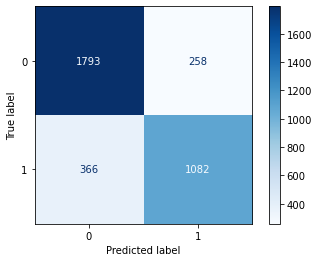

In [231]:
# View confusion matrix
plot_confusion_matrix(mnb_gs, X_test, y_test, cmap='Blues');

In [199]:
filename = '../models/mnb_gs_v1.sav'  
pickle.dump(mnb_gs, open(filename, 'wb'))


## **RandomForest Classifier**

### Base Model

In [190]:
X = df['title'] + ' ' + df['selftext']
y = df['subreddit'].map({'beyondthebump':0, 'BabyBumps':1})

In [191]:
(X.shape)

(10603,)

In [192]:
# Define training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.33,
                                                    stratify=y,
                                                    random_state=42)

In [193]:
X_train.shape, X_test.shape

((7104,), (3499,))

In [194]:
# Baseline Accuracy
y_train.value_counts(normalize=True)

0    0.586149
1    0.413851
Name: subreddit, dtype: float64

In [33]:
tvec = TfidfVectorizer( stop_words = p_stemmer_stopwords,tokenizer=PorterStemming())

In [34]:
Xtv_train = tvec.fit_transform(X_train)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['becau'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


In [36]:
Xtv_train_df = pd.DataFrame(data=Xtv_train.todense(),
                                                    columns=tvec.get_feature_names())
Xtv_train_df

,,0,00,000,00001,001,0024,01,0100,0200,...,zonessteel,zoneyep,zonk,zoo,zoom,zoomi,zs,zucchini,zygot,zyrtec
0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.131092,0.0,0.0,0.0,0.0,0.0
2,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
3,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
4,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7099,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
7100,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
7101,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
7102,0.128853,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0


In [40]:
Xtv_test = tvec.transform(X_test)

In [54]:
rfc = RandomForestClassifier(random_state=42)

In [55]:
rfc.fit(Xtv_train, y_train)

RandomForestClassifier(random_state=42)

In [56]:
rfc.score(Xtv_train, y_train), rfc.score(Xtv_test, y_test)

(0.9994369369369369, 0.8153758216633323)

In [57]:
d = {'Column Name':Xtv_train_df.columns,'Feature Importance':rfc.feature_importances_}
fi = pd.DataFrame(d)

fi.head()

,Column Name,Feature Importance
0,,0.002171
1,0,0.000082
2,00,0.000009
3,000,0.000007
4,00001,0.000038


In [60]:
 fi.sort_values(by=['Feature Importance'], ascending = False).head(10)

,Column Name,Feature Importance
14223,old,0.021236
13123,month,0.018111
15731,pregnanc,0.017877
15780,pregnant,0.016504
18165,sleep,0.007724
21705,week,0.007359
12019,lo,0.006504
10595,im,0.005832
20488,trimest,0.005523
18501,son,0.005511


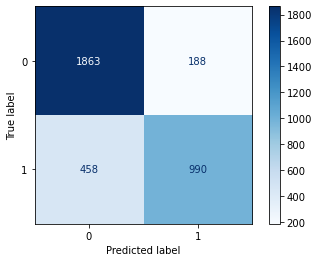

In [61]:
# View confusion matrix
plot_confusion_matrix(rfc, Xtv_test, y_test, cmap='Blues');

In [65]:
#https://stackoverflow.com/questions/34214087/how-do-you-access-tree-depth-in-pythons-scikit-learn
rfc_estimator_depth = [estimator.get_depth() for estimator in rfc.estimators_]

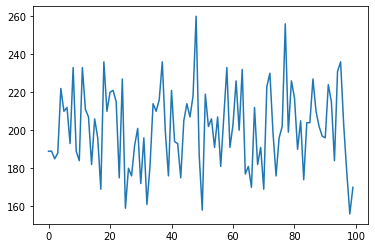

In [66]:
plt.plot(rfc_estimator_depth)

In [67]:
rfc_leaf = [estimator.get_n_leaves() for estimator in rfc.estimators_]

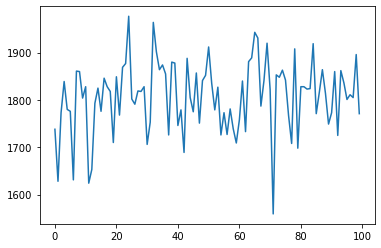

In [68]:
plt.plot(rfc_leaf)

### Tuning Hyperparameters - RandomizedSearch

In [319]:
rfc_pipe = Pipeline([
    ('tvec', TfidfVectorizer() ),
    ('rfc', RandomForestClassifier(random_state=42))
])

In [327]:
rfc_pipe_params = {
    'tvec__stop_words' : [p_stemmer_stopwords, p_stemmer_stopwords_spacy],
    'tvec__tokenizer' : [PorterStemming(), LemmaTokenizer()],
    'tvec__max_features': [750, 1000, 2000, 4000],
    'tvec__min_df': [1, 2, 3],
    'tvec__max_df': [0.7, 0.8, 0.9],
    'tvec__ngram_range': [(1,2), (1,3)],
    'rfc__n_estimators': [250, 500,750],
    'rfc__min_samples_leaf': [5,15,25],
    'rfc__min_samples_split': [200,400,600]
    
}

In [333]:
# Instantiate GridSearchCV.

rscv = RandomizedSearchCV(rfc_pipe, # what object are we optimizing?
                  rfc_pipe_params, # what parameters values are we searching?
                 cv = StratifiedShuffleSplit(n_splits=5,test_size=0.3,random_state = 0),
                          n_iter=200,
                        verbose=2) # 5-fold cross-validation.

In [334]:
import warnings
warnings.filterwarnings('ignore')

In [335]:
rscv.fit(X_train, y_train)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi'

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi'

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi'

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi'

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi'

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi'

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi'

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi'

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi'

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'our

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=750, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=200, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=200, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=1000, tvec__min_df=2, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=1000, tvec__min_df=1, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=4000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=250, tvec__max_df=0.8, tvec__max_features=2000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=5, rfc__min_samples_split=400, rfc__n_estimators=750, tvec__max_df=0.7, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'ou

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=400, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 3), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=750, tvec__max_df=0.9, tvec__max_features=4000, tvec__min_df=2, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

[CV] END rfc__min_samples_leaf=25, rfc__min_samples_split=600, rfc__n_estimators=500, tvec__max_df=0.7, tvec__max_features=4000, tvec__min_df=1, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'wh

[CV] END rfc__min_samples_leaf=15, rfc__min_samples_split=600, rfc__n_estimators=250, tvec__max_df=0.9, tvec__max_features=2000, tvec__min_df=3, tvec__ngram_range=(1, 2), tvec__stop_words=['do', 'togeth', 'your', 'becam', 'n‘t', 'then', 'twelv', 'per', 'seem', 'seem', 'done', 'alon', 'call', '’s', 'toward', 'forti', 'which', 'via', 'me', 'latterli', 'one', 'veri', 'henc', 'pleas', 'cannot', 'someth', 'part', 'two', 'inde', 'most', 'but', 'becaus', 'other', 'should', 're', 'wherein', 'alreadi', 'own', 'onc', 'three', 'eight', 'some', 'show', 'whenev', 'ani', 'either', 'due', 'while', 'thu', 'doe', 'll', 'through', 'about', 'of', 'whereaft', 'than', 'further', 'herein', 'did', 'seem', 'four', 'give', 'herebi', 'm', 'where', 'mine', 'be', 'all', 'so', 'these', 'anyhow', '’m', 'perhap', 'there', 'though', 'for', 'realli', 'out', 'abov', 'mani', 'we', 'much', 'them', 'never', 'otherwis', 'how', 'thenc', '‘ve', 'will', 'thereaft', 'other', 'enough', 'everyth', 'must', 'the', 'beforehand', 'o

RandomizedSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=0, test_size=0.3,
            train_size=None),
                   estimator=Pipeline(steps=[('tvec', TfidfVectorizer()),
                                             ('rfc',
                                              RandomForestClassifier(random_state=42))]),
                   n_iter=200,
                   param_distributions={'rfc__min_samples_leaf': [5, 15, 25],
                                        'rfc__min_samples_split': [200, 400,
                                                                   600],
                                        'rfc__n_estimators': [250, 500, 750],
                                        'tvec_...
                                                             ['do', 'togeth',
                                                              'your', 'becam',
                                                              'n‘t', 'then',
                                            

In [336]:
rscv.score(X_train, y_train), rscv.score(X_test, y_test)

(0.8959740990990991, 0.8382394969991426)

In [337]:
rscv.best_params_

{'tvec__tokenizer': <__main__.PorterStemming at 0x7ff5718de220>,
 'tvec__stop_words': ['i',
  'me',
  'my',
  'myself',
  'we',
  'our',
  'our',
  'ourselv',
  'you',
  'your',
  'youv',
  'youll',
  'youd',
  'your',
  'your',
  'yourself',
  'yourselv',
  'he',
  'him',
  'hi',
  'himself',
  'she',
  'she',
  'her',
  'her',
  'herself',
  'it',
  'it',
  'it',
  'itself',
  'they',
  'them',
  'their',
  'their',
  'themselv',
  'what',
  'which',
  'who',
  'whom',
  'thi',
  'that',
  'thatll',
  'these',
  'those',
  'am',
  'is',
  'are',
  'wa',
  'were',
  'be',
  'been',
  'be',
  'have',
  'ha',
  'had',
  'have',
  'do',
  'doe',
  'did',
  'do',
  'a',
  'an',
  'the',
  'and',
  'but',
  'if',
  'or',
  'becaus',
  'as',
  'until',
  'while',
  'of',
  'at',
  'by',
  'for',
  'with',
  'about',
  'against',
  'between',
  'into',
  'through',
  'dure',
  'befor',
  'after',
  'abov',
  'below',
  'to',
  'from',
  'up',
  'down',
  'in',
  'out',
  'on',
  'off',
  'ov

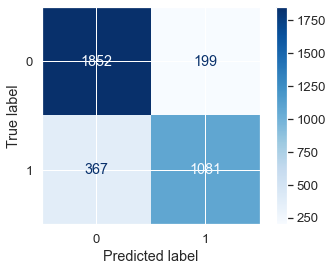

In [338]:
# View confusion matrix
plot_confusion_matrix(rscv, X_test, y_test, cmap='Blues');

In [ ]:
# save the model to disk
filename = '../models/rscv_v3.sav'
pickle.dump(rscv, open(filename, 'wb'))


## **Support Vector Classifier**

### Tuning Hyperparameters - RandomizedSearch

In [11]:
X = df['title'] + ' ' + df['selftext']
y = df['subreddit'].map({'beyondthebump':0, 'BabyBumps':1})

In [12]:
# Define training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.33,
                                                    stratify=y,
                                                    random_state=42)

In [13]:
# Baseline Accuracy
y_train.value_counts(normalize=True)

0    0.586149
1    0.413851
Name: subreddit, dtype: float64

In [229]:
svc_pipe = Pipeline([
    ('tvec', TfidfVectorizer() ),
    ('svc', SVC())
])

In [230]:
svc_pipe_params = {
    'tvec__stop_words' : [p_stemmer_stopwords],
    'tvec__tokenizer' : [PorterStemming()],
    'tvec__max_features': [500],
    'tvec__min_df': [0.02,0.03],
    'tvec__max_df': [0.9],
    'tvec__ngram_range': [(1,2), (1,3)],
    'svc__C': np.linspace(0.1, 1, 10),
    'svc__kernel' : ['linear', 'rbf'],
    'svc__gamma' : ['scale', 'auto']
    
}

In [231]:
cv_folds = StratifiedKFold(n_splits = 5, shuffle=True, random_state = 42)

In [235]:
# Instantiate GridSearchCV.

svc_cv = RandomizedSearchCV(svc_pipe, # what object are we optimizing?
                  svc_pipe_params, # what parameters values are we searching?
                 cv = cv_folds,
                          n_iter=25,
                        verbose=2) # 5-fold cross-validation.

In [236]:
import warnings
warnings.filterwarnings('ignore')

In [237]:
# Evaluate model.
svc_cv.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] END svc__C=0.9, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'her

[CV] END svc__C=0.4, svc__gamma=scale, svc__kernel=linear, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 

[CV] END svc__C=0.2, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bot

[CV] END svc__C=0.7000000000000001, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'al

[CV] END svc__C=0.6, svc__gamma=auto, svc__kernel=linear, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', '

[CV] END svc__C=0.4, svc__gamma=scale, svc__kernel=linear, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 

[CV] END svc__C=0.1, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bot

[CV] END svc__C=0.2, svc__gamma=scale, svc__kernel=linear, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 

[CV] END svc__C=0.2, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bot

[CV] END svc__C=0.30000000000000004, svc__gamma=scale, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', '

[CV] END svc__C=0.7000000000000001, svc__gamma=scale, svc__kernel=linear, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how',

[CV] END svc__C=0.30000000000000004, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'a

[CV] END svc__C=0.2, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bot

[CV] END svc__C=0.6, svc__gamma=scale, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bo

[CV] END svc__C=0.30000000000000004, svc__gamma=auto, svc__kernel=linear, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how',

[CV] END svc__C=0.6, svc__gamma=scale, svc__kernel=linear, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 

[CV] END svc__C=1.0, svc__gamma=scale, svc__kernel=linear, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 

[CV] END svc__C=0.9, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bot

[CV] END svc__C=0.7000000000000001, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'al

[CV] END svc__C=0.4, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bot

[CV] END svc__C=0.30000000000000004, svc__gamma=scale, svc__kernel=linear, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how'

[CV] END svc__C=0.5, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 2), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bot

[CV] END svc__C=1.0, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bot

[CV] END svc__C=0.9, svc__gamma=scale, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.02, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bo

[CV] END svc__C=0.4, svc__gamma=auto, svc__kernel=rbf, tvec__max_df=0.9, tvec__max_features=500, tvec__min_df=0.03, tvec__ngram_range=(1, 3), tvec__stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', 'your', 'youv', 'youll', 'youd', 'your', 'your', 'yourself', 'yourselv', 'he', 'him', 'hi', 'himself', 'she', 'she', 'her', 'her', 'herself', 'it', 'it', 'it', 'itself', 'they', 'them', 'their', 'their', 'themselv', 'what', 'which', 'who', 'whom', 'thi', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'wa', 'were', 'be', 'been', 'be', 'have', 'ha', 'had', 'have', 'do', 'doe', 'did', 'do', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'becaus', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'dure', 'befor', 'after', 'abov', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'onc', 'here', 'there', 'when', 'where', 'whi', 'how', 'all', 'ani', 'bot

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('tvec', TfidfVectorizer()),
                                             ('svc', SVC())]),
                   n_iter=25,
                   param_distributions={'svc__C': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
                                        'svc__gamma': ['scale', 'auto'],
                                        'svc__kernel': ['linear', 'rbf'],
                                        'tvec__max_df': [0.9],
                                        'tvec__max_features': [500],
                                        'tvec....03],
                                        'tvec__ngram_range': [(1, 2), (1, 3)],
                                        'tvec__stop_words': [['i', 'me', 'my',
                                                              'myself', 'we',
                                                              'our', 'our

In [238]:
svc_cv.score(X_train, y_train), svc_cv.score(X_test, y_test)

(0.9383445945945946, 0.8310945984567019)

In [239]:
svc_cv.best_params_

{'tvec__tokenizer': <__main__.PorterStemming at 0x7fbe5e361fd0>,
 'tvec__stop_words': ['i',
  'me',
  'my',
  'myself',
  'we',
  'our',
  'our',
  'ourselv',
  'you',
  'your',
  'youv',
  'youll',
  'youd',
  'your',
  'your',
  'yourself',
  'yourselv',
  'he',
  'him',
  'hi',
  'himself',
  'she',
  'she',
  'her',
  'her',
  'herself',
  'it',
  'it',
  'it',
  'itself',
  'they',
  'them',
  'their',
  'their',
  'themselv',
  'what',
  'which',
  'who',
  'whom',
  'thi',
  'that',
  'thatll',
  'these',
  'those',
  'am',
  'is',
  'are',
  'wa',
  'were',
  'be',
  'been',
  'be',
  'have',
  'ha',
  'had',
  'have',
  'do',
  'doe',
  'did',
  'do',
  'a',
  'an',
  'the',
  'and',
  'but',
  'if',
  'or',
  'becaus',
  'as',
  'until',
  'while',
  'of',
  'at',
  'by',
  'for',
  'with',
  'about',
  'against',
  'between',
  'into',
  'through',
  'dure',
  'befor',
  'after',
  'abov',
  'below',
  'to',
  'from',
  'up',
  'down',
  'in',
  'out',
  'on',
  'off',
  'ov

In [240]:
# save the model to disk
filename = '../models/svc_cv_v1.sav'
pickle.dump(svc_cv, open(filename, 'wb'))
